In [756]:
import warnings
import numpy as np
import pandas as pd
from rasterio.plot import show, show_hist
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 150)  # display all column of dataframe
pd.set_option('display.max_row', 100)     # display 100 rows of the dataframe
pd.set_option('display.max_colwidth', -1) # display all values within cells
pd.set_option('display.float_format', '{:.10f}'.format)
import sklearn
# logistic regression for feature importance
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns 
import matplotlib.pyplot as plt
from scipy.stats import kstest
from sklearn import model_selection
from sklearn import linear_model
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import KFold, StratifiedKFold

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import roc_auc_score,confusion_matrix, classification_report

ImportError: cannot import name 'delayed' from 'sklearn.utils.fixes' (/Users/jakelieberfarb/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/fixes.py)

In [761]:
from imblearn.over_sampling import SMOTE

ImportError: cannot import name 'delayed' from 'sklearn.utils.fixes' (/Users/jakelieberfarb/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/fixes.py)

In [681]:
def Distribution_plot(dataframe,feature, target, title, xlabel):
    """"
    Plot Distribution of feature for both classes
    
    Parameters
    ------------
    dataframe: Training dataframe
    feature: Variable to find distribution
    target: Dependent variable column containing all classes
    title: Plot title
    """
    
    # set the figure size
    plt.figure(figsize=(10,8))

    ax = plt.subplot()
    #distribution plot for all classes
    sns.distplot(dataframe[feature][dataframe[target] == 0], bins=50, label="Deprived Area")
    sns.distplot(dataframe[feature][dataframe[target] ==1], bins=50, label="Developed Area")
    sns.distplot(dataframe[feature][dataframe[target] ==2], bins=50, label="Water Area")

    plt.title(title, fontsize=14)
    plt.xlabel(xlabel)

    # Add legend and show plot
    ax.legend(title="Area classification")
    plt.show()
    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)        


    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [571]:
#read data
df = pd.read_csv('Contextual_Features_final.csv')

# Data Overview

In [572]:
df.head()

,long_x,lat_x,Label_x,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,long_y,lat_y,Label_y,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,...,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,long,lat,Label,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,3.2041666690,6.9116668400,0,1,0.0000000000,0.2700303285,14.3400000000,5.8600000000,1.5605352609,1.3571174461,3.6840173970,3.0622886280,0.0000000000,0.4450898083,0.0000000000,0.4393513149,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.6696591166,2.3767978600,0.0297030714,155.9430564400,2.9936234700,5.7093206350,0.2890089718,0.0000000000,19.2936329110,0.0000000000,0.0000000000,0.0009225654,0.0000000000,1.9259881459,0.6783329560,23.3608649030,0.5526671735,1.9196933109,26.3800000000,0.0000000000,0.0000000000,3.7708017440,1.2168429960,0.6850358957,0.2135762563,0.0613977521,7.2355880560,3.2041666688,6.9116668404,0,61.4551483200,21.7459551400,69.5262565100,21.5813566000,74.9410080100,21.3992938700,11.9917303810,0.6667498806,11.9924461410,0.7096281644,11.9693735500,0.7042853254,0.7103381489,11.9945281920,0.6661052694,11.9968413510,0.6582763655,11.9977100210,0.6888771717,11.9912195610,11.9950388960,0.6877209277,7.9470801460,...,23.4860506950,23.5585811200,7.9543920290,23.3356346400,7.9508512890,23.3095601850,7.9581975980,23.3462561450,7.9450535260,7.9486371390,23.6986007600,5.9236401820,49.4942105500,5.8894272300,49.1101993300,5.8523924770,49.7633514700,50.7046440700,5.9332592540,49.5953933000,5.9477596140,49.5806863800,5.9509599160,49.8517311700,5.9298494370,5.9126846020,51.7492199000,20306.1108540000,0.5916397085,0.1011072928,869.3649034000,0.0530579663,151342.2376700000,0.4108726155,0.1

In [573]:
df.describe()

,long_x,lat_x,Label_x,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,long_y,lat_y,Label_y,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,...,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,long,lat,Label,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
count,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,...,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,47560.0000000000,

In [574]:
# check shape of data
df.shape

(47560, 154)

In [575]:
df= df.drop(columns= ['long_x','lat_x','Label_x','long_y','lat_y','Label_y'])
cols_to_move = ['lat','long','Label','Point']
df = df[ cols_to_move + [ col for col in df.columns if col not in cols_to_move ] ]
df.head()

,lat,long,Label,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,6.9116668404,3.2041666688,0,1,0.0000000000,0.2700303285,14.3400000000,5.8600000000,1.5605352609,1.3571174461,3.6840173970,3.0622886280,0.0000000000,0.4450898083,0.0000000000,0.4393513149,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.6696591166,2.3767978600,0.0297030714,155.9430564400,2.9936234700,5.7093206350,0.2890089718,0.0000000000,19.2936329110,0.0000000000,0.0000000000,0.0009225654,0.0000000000,1.9259881459,0.6783329560,23.3608649030,0.5526671735,1.9196933109,26.3800000000,0.0000000000,0.0000000000,3.7708017440,1.2168429960,0.6850358957,0.2135762563,0.0613977521,7.2355880560,61.4551483200,21.7459551400,69.5262565100,21.5813566000,74.9410080100,21.3992938700,11.9917303810,0.6667498806,11.9924461410,0.7096281644,11.9693735500,0.7042853254,0.7103381489,11.9945281920,0.6661052694,11.9968413510,0.6582763655,11.9977100210,0.6888771717,11.9912195610,11.9950388960,0.6877209277,7.9470801460,23.3234070100,7.9370275580,23.4020880650,7.9176978860,23.4860506950,23.5585811200,7.9543920290,23.3356346400,7.9508512890,23.3095601850,7.9581975980,23.3462561450,7.9450535260,7.9486371390,23.6986007600,5.9236401820,49.4942105500,5.8894272300,49.1101993300,5.8523924770,49.7633514700,50.7046440700,5.9332592540,49.5953933000,5.9477596140,49.5806863800,5.9509599160,49.8517311700,5.9298494370,5.9126846020,51.7492199000,20306.1108540000,0.5916397085,0.1011072928,869.36

In [576]:
target = 'Label'
first_col = df.pop(target)
df.insert(0, target,  first_col)

In [577]:
df.head()

,Label,lat,long,Point,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,0,6.9116668404,3.2041666688,1,0.0000000000,0.2700303285,14.3400000000,5.8600000000,1.5605352609,1.3571174461,3.6840173970,3.0622886280,0.0000000000,0.4450898083,0.0000000000,0.4393513149,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.6696591166,2.3767978600,0.0297030714,155.9430564400,2.9936234700,5.7093206350,0.2890089718,0.0000000000,19.2936329110,0.0000000000,0.0000000000,0.0009225654,0.0000000000,1.9259881459,0.6783329560,23.3608649030,0.5526671735,1.9196933109,26.3800000000,0.0000000000,0.0000000000,3.7708017440,1.2168429960,0.6850358957,0.2135762563,0.0613977521,7.2355880560,61.4551483200,21.7459551400,69.5262565100,21.5813566000,74.9410080100,21.3992938700,11.9917303810,0.6667498806,11.9924461410,0.7096281644,11.9693735500,0.7042853254,0.7103381489,11.9945281920,0.6661052694,11.9968413510,0.6582763655,11.9977100210,0.6888771717,11.9912195610,11.9950388960,0.6877209277,7.9470801460,23.3234070100,7.9370275580,23.4020880650,7.9176978860,23.4860506950,23.5585811200,7.9543920290,23.3356346400,7.9508512890,23.3095601850,7.9581975980,23.3462561450,7.9450535260,7.9486371390,23.6986007600,5.9236401820,49.4942105500,5.8894272300,49.1101993300,5.8523924770,49.7633514700,50.7046440700,5.9332592540,49.5953933000,5.9477596140,49.5806863800,5.9509599160,49.8517311700,5.9298494370,5.9126846020,51.7492199000,20306.1108540000,0.5916397085,0.1011072928,869.36

In [578]:
def count_values_in_column(data,feature):
    total=data.loc[:,feature].value_counts(dropna=False)
    percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])
#Count_values for sentiment
pie_data= count_values_in_column(df,"Label") # save data aS a dataframe
count_values_in_column(df,"Label")

,Total,Percentage
2,32089,67.4700000000
0,15202,31.9600000000
1,269,0.5700000000


<function matplotlib.pyplot.show(close=None, block=None)>

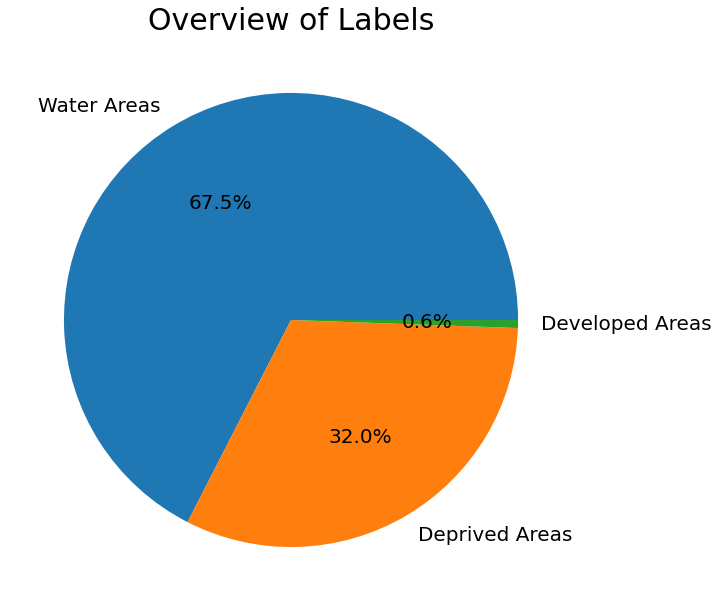

In [752]:
plt.figure(figsize=(10,10))
labels = ['Water Areas','Deprived Areas','Developed Areas']
plt.title('Overview of Labels', fontsize=30)
plt.pie(pie_data['Total'], labels=labels, autopct='%1.1f%%', textprops={'fontsize': 20})
plt.rcParams["axes.labelweight"] = "bold"
plt.tight_layout()
plt.show

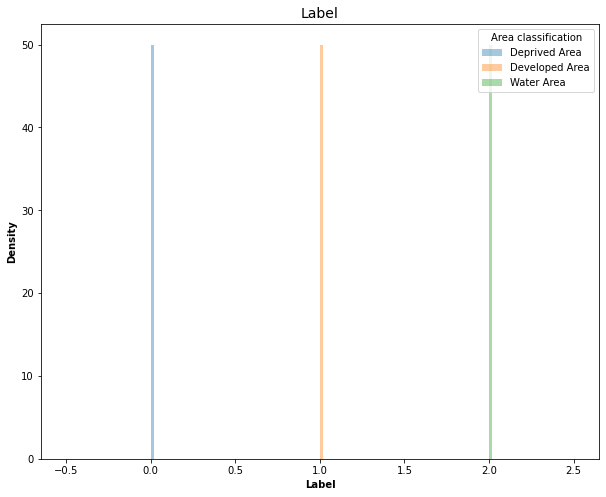

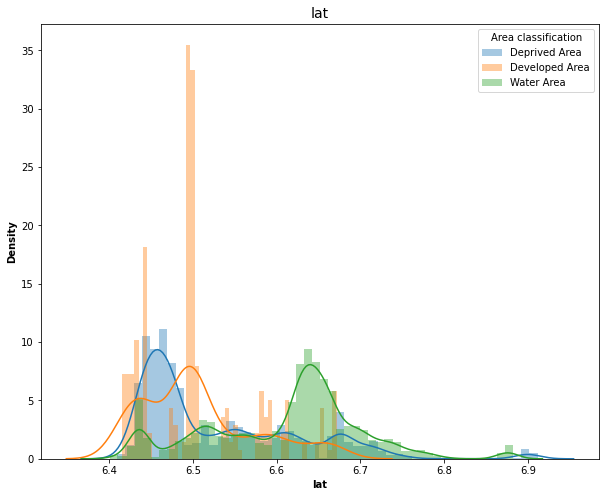

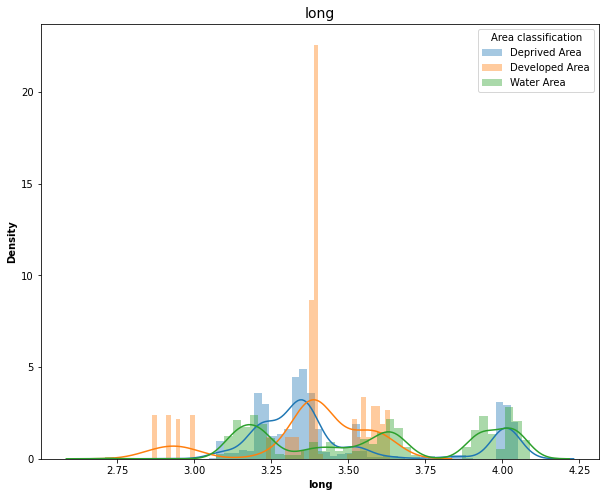

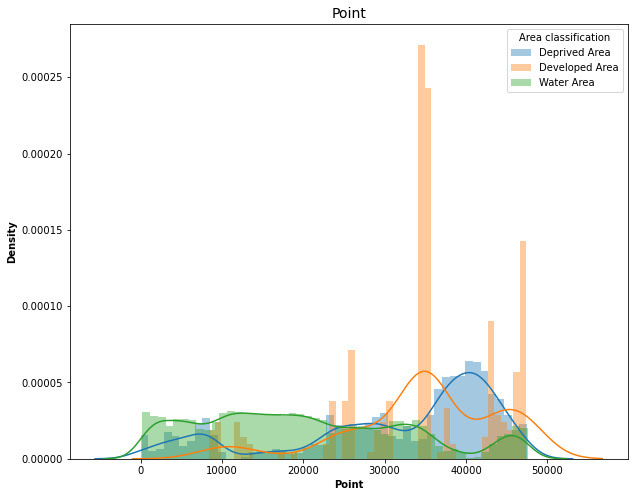

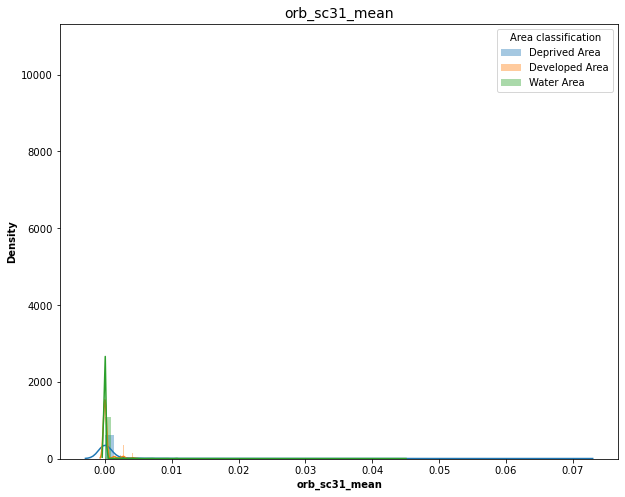

...

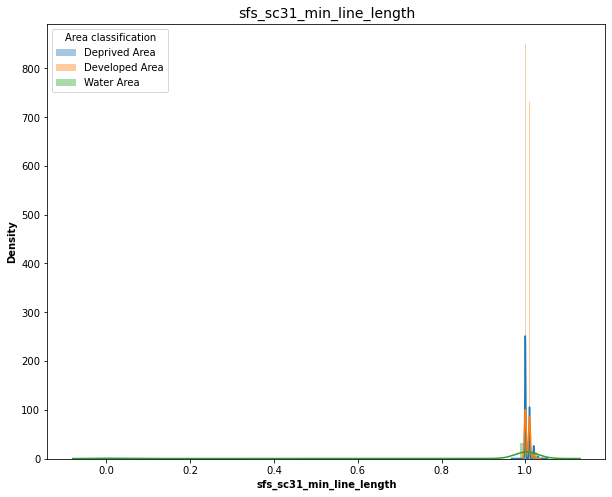

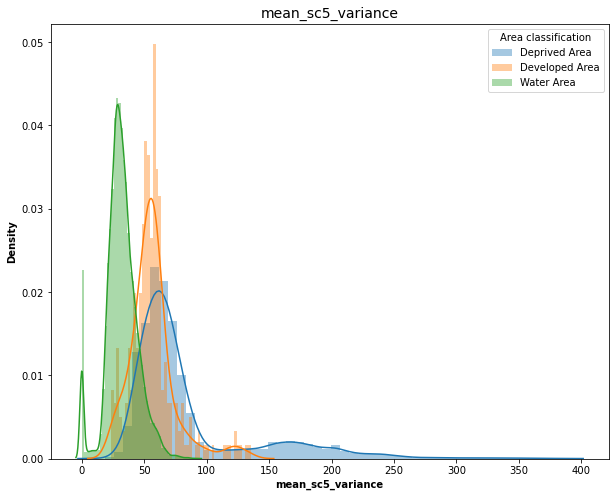

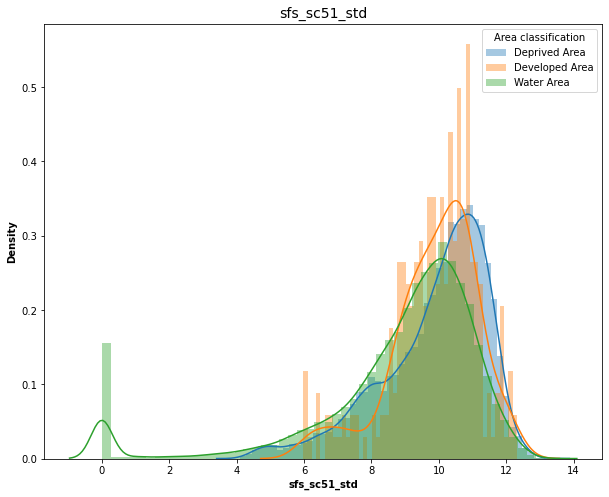

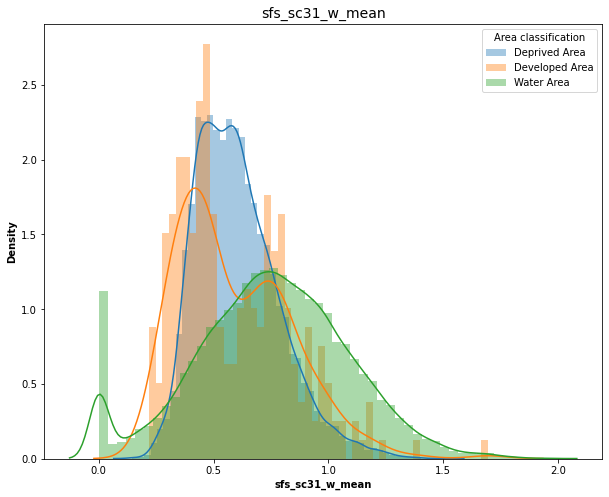

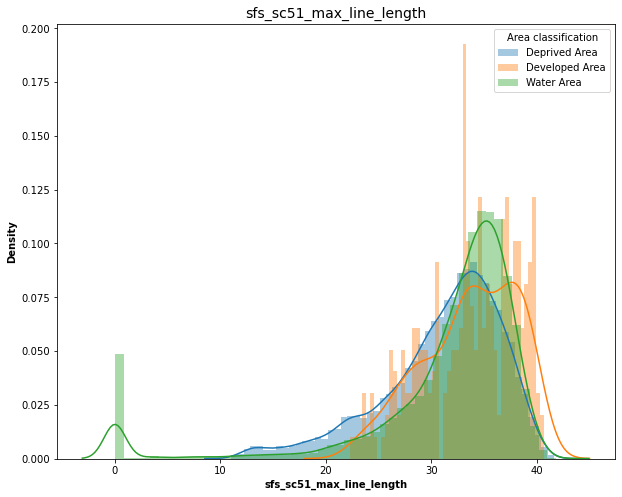

In [684]:
# Overview of distribution plots for 
for i in df.columns:
    Distribution_plot(df, "{}".format(i), "Label", "{}".format(i), "{}".format(i))

In [581]:
x = df.values[:, 1:]
y = df.values[:, 0]

In [592]:
x_t = df.iloc[:, 4:]
y_t= df[['Label']]

,orb_sc31_mean,lbpm_sc7_skew,lbpm_sc5_max,lbpm_sc3_max,lbpm_sc5_skew,lbpm_sc3_variance,lsr_sc71_line_contrast,lsr_sc51_line_length,orb_sc71_variance,lbpm_sc3_mean,orb_sc51_skew,ndvi_sc3_mean,orb_sc71_max,orb_sc51_variance,orb_sc51_kurtosis,orb_sc71_kurtosis,orb_sc51_max,orb_sc31_kurtosis,lsr_sc31_line_mean,lbpm_sc7_mean,ndvi_sc5_variance,lbpm_sc3_kurtosis,lsr_sc51_line_contrast,lbpm_sc5_kurtosis,ndvi_sc5_mean,orb_sc31_skew,lbpm_sc3_skew,orb_sc71_skew,orb_sc31_max,ndvi_sc3_variance,orb_sc51_mean,lsr_sc31_line_length,lsr_sc51_line_mean,lbpm_sc7_variance,lbpm_sc7_kurtosis,lsr_sc31_line_contrast,lbpm_sc7_max,orb_sc31_variance,orb_sc71_mean,lsr_sc71_line_length,lbpm_sc5_mean,lsr_sc71_line_mean,ndvi_sc7_mean,ndvi_sc7_variance,lbpm_sc5_variance,fourier_sc31_mean,fourier_sc31_variance,fourier_sc51_mean,fourier_sc51_variance,fourier_sc71_mean,fourier_sc71_variance,gabor_sc3_filter_1,gabor_sc3_filter_10,gabor_sc3_filter_11,gabor_sc3_filter_12,gabor_sc3_filter_13,gabor_sc3_filter_14,gabor_sc3_filter_2,gabor_sc3_filter_3,gabor_sc3_filter_4,gabor_sc3_filter_5,gabor_sc3_filter_6,gabor_sc3_filter_7,gabor_sc3_filter_8,gabor_sc3_filter_9,gabor_sc3_mean,gabor_sc3_variance,gabor_sc5_filter_1,gabor_sc5_filter_10,gabor_sc5_filter_11,gabor_sc5_filter_12,gabor_sc5_filter_13,gabor_sc5_filter_14,gabor_sc5_filter_2,gabor_sc5_filter_3,gabor_sc5_filter_4,gabor_sc5_filter_5,gabor_sc5_filter_6,gabor_sc5_filter_7,gabor_sc5_filter_8,gabor_sc5_filter_9,gabor_sc5_mean,gabor_sc5_variance,gabor_sc7_filter_1,gabor_sc7_filter_10,gabor_sc7_filter_11,gabor_sc7_filter_12,gabor_sc7_filter_13,gabor_sc7_filter_14,gabor_sc7_filter_2,gabor_sc7_filter_3,gabor_sc7_filter_4,gabor_sc7_filter_5,gabor_sc7_filter_6,gabor_sc7_filter_7,gabor_sc7_filter_8,gabor_sc7_filter_9,gabor_sc7_mean,gabor_sc7_variance,hog_sc3_kurtosis,hog_sc3_max,hog_sc3_mean,hog_sc3_skew,hog_sc3_variance,hog_sc5_kurtosis,hog_sc5_max,hog_sc5_mean,hog_sc5_skew,hog_sc5_variance,hog_sc7_kurtosis,hog_sc7_max,hog_sc7_mean,hog_sc7_skew,hog_sc7_variance,lac_sc5_lac,lac_sc7_lac,sfs_sc31_std,sfs_sc71_max_line_length,sfs_sc71_max_ratio_of_orthogonal_angles,mean_sc3_variance,mean_sc7_variance,pantex_sc3_min,sfs_sc51_max_ratio_of_orthogonal_angles,sfs_sc71_std,sfs_sc31_max_line_length,sfs_sc71_w_mean,mean_sc7_mean,sfs_sc31_max_ratio_of_orthogonal_angles,pantex_sc5_min,sfs_sc51_min_line_length,sfs_sc51_mean,lac_sc3_lac,mean_sc5_mean,sfs_sc51_w_mean,sfs_sc31_mean,pantex_sc7_min,sfs_sc71_mean,mean_sc3_mean,sfs_sc71_min_line_length,sfs_sc31_min_line_length,mean_sc5_variance,sfs_sc51_std,sfs_sc31_w_mean,sfs_sc51_max_line_length
0,0.0000000000,0.2700303285,14.3400000000,5.8600000000,1.5605352609,1.3571174461,3.6840173970,3.0622886280,0.0000000000,0.4450898083,0.0000000000,0.4393513149,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.6696591166,2.3767978600,0.0297030714,155.9430564400,2.9936234700,5.7093206350,0.2890089718,0.0000000000,19.2936329110,0.0000000000,0.0000000000,0.0009225654,0.0000000000,1.9259881459,0.6783329560,23.3608649030,0.5526671735,1.9196933109,26.3800000000,0.0000000000,0.0000000000,3.7708017440,1.2168429960,0.6850358957,0.2135762563,0.0613977521,7.2355880560,61.4551483200,21.7459551400,69.5262565100,21.5813566000,74.9410080100,21.3992938700,11.9917303810,0.6667498806,11.9924461410,0.7096281644,11.9693735500,0.7042853254,0.7103381489,11.9945281920,0.6661052694,11.9968413510,0.6582763655,11.9977100210,0.6888771717,11.9912195610,11.9950388960,0.6877209277,7.9470801460,23.3234070100,7.9370275580,23.4020880650,7.9176978860,23.4860506950,23.5585811200,7.9543920290,23.3356346400,7.9508512890,23.3095601850,7.9581975980,23.3462561450,7.9450535260,7.9486371390,23.6986007600,5.9236401820,49.4942105500,5.8894272300,49.1101993300,5.8523924770,49.7633514700,50.7046440700,5.9332592540,49.5953933000,5.9477596140,49.5806863800,5.9509599160,49.8517311700,5.9298494370,5.9126846020,51.7492199000,20306.1108540000,0.5916397085,0.1011072928,869.3649034000,0.0530579663,151342.2376700000,0.410872615

In [603]:
# split data into train and test
#x = df.iloc[:, 4:]
#y= df[['Label']]
#x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.20,random_state=42) #brad
X_train, X_test, Y_train, Y_test = train_test_split(x_t,y_t, test_size=0.20,random_state=42) #Jake
print('X_train dimension= ', x_train.shape)
print('X_test dimension= ', x_test.shape)
print('y_train dimension= ', y_train.shape)
print('y_train dimension= ', y_test.shape)

X_train dimension=  (38048, 147)
X_test dimension=  (9512, 147)
y_train dimension=  (38048,)
y_train dimension=  (9512,)


In [774]:
# Singular Value Decomposition
svd = TruncatedSVD(n_components=25, n_iter=7, random_state=42) # define transform
svd.fit(x) # prepare transform on dataset
X_transformed = svd.transform(x) # apply transform to dataset
print('post-SVD shape: ', X_transformed.shape)

post-SVD shape:  (47560, 25)


# Over Sampling

# Normality Checks on data

In [605]:
# Check Normality of each Variabes
Norm= []
Norm_col = []
for col in X_train:
    Norm_col.append(col)
    Norm.append(stats.kstest(X_train[col],'norm'))
norm = pd.DataFrame (Norm, columns = ['Statistics','p-value'])
norm_col= pd.DataFrame (Norm_col, columns = ['contextual_feature'])
normal_check = norm_col.merge(norm, left_index=True, right_index=True)

In [606]:
Names = []
for i in x_t:
    Names.append(i)
names = pd.DataFrame (Names, columns = ['Contextual_features'])

In [607]:
#stats.kstest(x_train['orb_sc31_mean'],'norm')
names

,Contextual_features
0,orb_sc31_mean
1,lbpm_sc7_skew
2,lbpm_sc5_max
3,lbpm_sc3_max
4,lbpm_sc5_skew
...,...
139,sfs_sc31_min_line_length
140,mean_sc5_variance
141,sfs_sc51_std
142,sfs_sc31_w_mean


In [608]:
normal_check.head(144) # none of the values appear normally distributed

,contextual_feature,Statistics,p-value
0,orb_sc31_mean,0.5000000000,0.0000000000
1,lbpm_sc7_skew,0.5001963983,0.0000000000
2,lbpm_sc5_max,0.9585473880,0.0000000000
3,lbpm_sc3_max,0.9519602774,0.0000000000
4,lbpm_sc5_skew,0.7849936145,0.0000000000
...,...,...,...
139,sfs_sc31_min_line_length,0.7945617351,0.0000000000
140,mean_sc5_variance,0.9714302683,0.0000000000
141,sfs_sc51_std,0.9669876058,0.0000000000
142,sfs_sc31_w_mean,0.5514554052,0.0000000000


In [762]:
plt.figure(figsize=(150, 150))
plt.title('Correlation Heat Map', fontsize= 180)
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, cmap='YlOrRd', square=True)

<AxesSubplot:title={'center':'Correlation Heat Map'}>

In [698]:
Y_t= Y_train['Label']

In [699]:
Y = pd.get_dummies(Y_t)
Y = Y.rename(columns={0:'0_Label',1:'1_Label',2:'2_Label'})



# biserial Correlation on Label

In [528]:
y_train_0 = y['0_Label']
y_train_1 = y['1_Label']
y_train_2 = y['2_Label']

In [613]:
from scipy import stats

val_0 = []
val_1 = []
val_2 = []
corr_0 = []
corr_1 = []
corr_2 = []

for col in X_train:
    val_0.append(col)
    corr_0.append(stats.pointbiserialr(X_train[col],y_train_0))
Val_0 = pd.DataFrame (val_0, columns = ['Contextual_Feature'])
Corr_0 = pd.DataFrame (corr_0, columns = ['correlation_0', 'p-value_0'])
Ex_0 = pd.merge(Val_0,Corr_0, left_index=True, right_index=True)
Ex_0 = Ex_0.sort_values('p-value_0', ascending=False)
Ex_0 = Ex_0.drop_duplicates().reset_index(drop=True)

In [614]:
for col in X_train:
    val_1.append(col)
    corr_1.append(stats.pointbiserialr(X_train[col],y_train_1))
Val_1 = pd.DataFrame (val_1, columns = ['Contextual_Feature'])
Corr_1 = pd.DataFrame (corr_1, columns = ['correlation_1', 'p-value_1'])
Ex_1 = pd.merge(Val_1,Corr_1, left_index=True, right_index=True)
Ex_1 = Ex_1.sort_values('p-value_1', ascending=False)
Ex_1= Ex_1.drop_duplicates().reset_index(drop=True)

In [615]:
for col in X_train:
    val_2.append(col)
    corr_2.append(stats.pointbiserialr(X_train[col],y_train_2))
Val_2 = pd.DataFrame (val_2, columns = ['Contextual_Feature'])
Corr_2 = pd.DataFrame (corr_2, columns = ['correlation_2', 'p-value_2'])
Ex_2 = pd.merge(Val_2,Corr_2, left_index=True, right_index=True)
Ex_2 = Ex_2.sort_values('p-value_2', ascending=False)
Ex_2= Ex_2.drop_duplicates().reset_index(drop=True)

In [616]:
Ex_final_0 = Ex_0.merge(Ex_1, left_on=['Contextual_Feature'], right_on=['Contextual_Feature'])
Ex_final = Ex_final_0.merge(Ex_2, left_on=['Contextual_Feature'], right_on=['Contextual_Feature'])
Ex_final.head()

,Contextual_Feature,correlation_0,p-value_0,correlation_1,p-value_1,correlation_2,p-value_2
0,hog_sc5_max,0.0151947189,0.0030372764,-0.0077525866,0.1304869196,-0.0138715051,0.0068139515
1,sfs_sc51_max_line_length,-0.0308801727,0.0000000017,0.0226563778,0.0000098814,0.0270764425,0.0000001276
2,lbpm_sc5_max,0.0322589642,0.0000000003,0.0188941159,0.0002280976,-0.0351596978,0.0000000000
3,lbpm_sc7_max,0.0385507459,0.0000000000,0.0235885382,0.0000041917,-0.0421802552,0.0000000000
4,hog_sc7_max,-0.0399153927,0.0000000000,-0.0157786864,0.0020848954,0.0422771320,0.0000000000


In [618]:
Ex_final.sort_values('p-value_0',ascending = False).head() #no values were significant on the 0 variable

,Contextual_Feature,correlation_0,p-value_0,correlation_1,p-value_1,correlation_2,p-value_2
0,hog_sc5_max,0.0151947189,0.0030372764,-0.0077525866,0.1304869196,-0.0138715051,0.0068139515
1,sfs_sc51_max_line_length,-0.0308801727,0.0000000017,0.0226563778,0.0000098814,0.0270764425,0.0000001276
2,lbpm_sc5_max,0.0322589642,0.0000000003,0.0188941159,0.0002280976,-0.0351596978,0.0000000000
3,lbpm_sc7_max,0.0385507459,0.0000000000,0.0235885382,0.0000041917,-0.0421802552,0.0000000000
4,hog_sc7_max,-0.0399153927,0.0000000000,-0.0157786864,0.0020848954,0.0422771320,0.0000000000


In [632]:
#43 variables were found to be significant 
var_import = Ex_final.sort_values('p-value_1',ascending = False).reset_index(drop=True).head(100) 

In [629]:
var_import.head()

,Contextual_Feature,correlation_0,p-value_0,correlation_1,p-value_1,correlation_2,p-value_2
0,lbpm_sc3_variance,-0.1079625705,0.0000000000,0.0000223128,0.9965274890,0.1074539515,0.0000000000
1,lac_sc5_lac,0.5317367798,0.0000000000,0.0001060781,0.9834923022,-0.5292666140,0.0000000000
2,lbpm_sc5_variance,-0.1858585955,0.0000000000,0.0005648977,0.9122628623,0.1848979692,0.0000000000
3,sfs_sc71_max_line_length,-0.2699943495,0.0000000000,0.0006824667,0.8941009308,0.2686211735,0.0000000000
4,orb_sc71_skew,0.1684593800,0.0000000000,-0.0026481249,0.6054881751,-0.1672436750,0.0000000000


In [636]:
print(var_import[['Contextual_Feature']][0:44])

          Contextual_Feature
0   lbpm_sc3_variance       
1   lac_sc5_lac             
2   lbpm_sc5_variance       
3   sfs_sc71_max_line_length
4   orb_sc71_skew           
5   lbpm_sc7_variance       
6   lsr_sc31_line_length    
7   orb_sc51_skew           
8   gabor_sc3_filter_14     
9   pantex_sc5_min          
10  orb_sc71_kurtosis       
11  gabor_sc3_filter_12     
12  gabor_sc3_variance      
13  lsr_sc31_line_contrast  
14  lac_sc7_lac             
15  sfs_sc31_mean           
16  gabor_sc3_filter_2      
17  gabor_sc3_filter_10     
18  lsr_sc31_line_mean      
19  orb_sc51_kurtosis       
20  gabor_sc3_filter_4      
21  sfs_sc71_min_line_length
22  gabor_sc3_filter_8      
23  lsr_sc51_line_mean      
24  lsr_sc71_line_mean      
25  orb_sc31_kurtosis       
26  pantex_sc7_min          
27  gabor_sc3_filter_6      
28  orb_sc31_skew           
29  lsr_sc51_line_length    
30  mean_sc3_variance       
31  hog_sc5_max             
32  sfs_sc71_std            
33  sfs_sc51_w

In [624]:
# no variables appeared to be significant
Ex_final.sort_values('p-value_2',ascending = False).head()

,Contextual_Feature,correlation_0,p-value_0,correlation_1,p-value_1,correlation_2,p-value_2
0,hog_sc5_max,0.0151947189,0.0030372764,-0.0077525866,0.1304869196,-0.0138715051,0.0068139515
1,sfs_sc51_max_line_length,-0.0308801727,0.0000000017,0.0226563778,0.0000098814,0.0270764425,0.0000001276
2,lbpm_sc5_max,0.0322589642,0.0000000003,0.0188941159,0.0002280976,-0.0351596978,0.0000000000
5,ndvi_sc3_variance,-0.0434646235,0.0000000000,0.0271485547,0.0000001181,0.0388764857,0.0000000000
3,lbpm_sc7_max,0.0385507459,0.0000000000,0.0235885382,0.0000041917,-0.0421802552,0.0000000000


# Feature Scaling

In [719]:
from sklearn import datasets
iris = datasets.load_iris()
X_iris = iris.data
y_iris = iris.target
type(Y_train.values)
Y_train.value_counts()

Label
2        25682
0        12147
1        219  
dtype: int64

In [690]:
sc = StandardScaler()
X_scaled = sc.fit_transform(x_t)
sc.fit(X_train)
X_train_scaled = sc.transform(X_train)
X_test_scaled = sc.transform(X_test)

# PCA feature selection

In [734]:
from sklearn.decomposition import PCA
pca = PCA() # estimate only 2 PCs
X_new = pca.fit_transform(X_train_scaled)

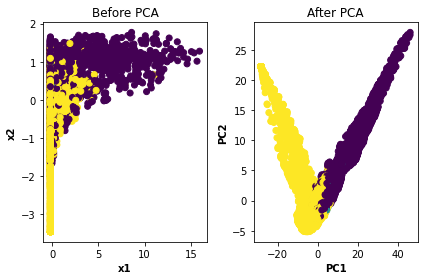

In [735]:
fig, axes = plt.subplots(1,2)
axes[0].scatter(X_train_scaled[:,0], X_train_scaled[:,1], c=Y_train.values)
axes[0].set_xlabel('x1')
axes[0].set_ylabel('x2')
axes[0].set_title('Before PCA')
axes[1].scatter(X_new[:,0], X_new[:,1], c=Y_train.values)
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].set_title('After PCA')
plt.tight_layout()
plt.show()

In [740]:
total_explained_variance = pca.explained_variance_ratio_.cumsum()
n_over_95 = len(total_explained_variance[total_explained_variance >= .95])
n_to_reach_95 = abs(X.shape[1] - n_over_95 + 1)
print("Number features: {}\tTotal Variance Explained: {}".format(n_to_reach_95, total_explained_variance[n_to_reach_95-1]))

Number features: 121	Total Variance Explained: 0.9999997180414656


In [741]:
pipe = Pipeline([('scaler', StandardScaler()),
 ('pca', PCA(n_components=n_to_reach_95)),
 ('clf', RandomForestClassifier())])
pipe.fit(X_train,Y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=121)),
                ('clf', RandomForestClassifier())])

In [786]:
 pca.explained_variance_ratio_.cumsum()[0:8]

array([0.50548819, 0.7189443 , 0.78736557, 0.83934874, 0.86360452,
       0.88672985, 0.90566304, 0.9173738 ])

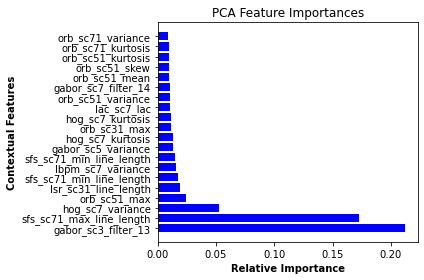

In [751]:
model = pipe.steps[1][1]
n_pcs= model.components_.shape[0]
initial_feature_names = X_train.columns
most_important = [np.abs(model.components_[i]).argmax() for i in range(n_pcs)]
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
zipped_feats = zip(most_important_names, pipe.steps[2][1].feature_importances_)
zipped_feats = sorted(zipped_feats, key=lambda x: x[1], reverse=True)
features, importances = zip(*zipped_feats)
top_features = features[:20]
top_importances = importances[:20]
plt.title('PCA Feature Importances')
plt.barh(range(len(top_importances)), top_importances, color='b', align='center')
plt.yticks(range(len(top_importances)), top_features)
plt.xlabel('Relative Importance')
plt.ylabel('Contextual Features')
plt.tight_layout()
plt.show()

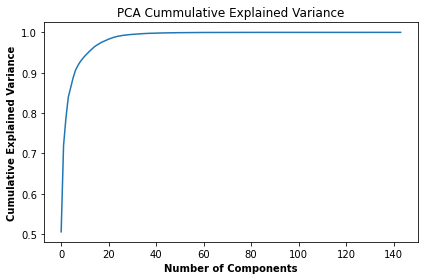

In [780]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA Cummulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.tight_layout()
plt.show()

# Full Logist Model

In [665]:
lm = LogisticRegression(C=1000.0, random_state=42)
# fit the model
lm.fit(X_train_scaled, Y_train)

LogisticRegression(C=1000.0, random_state=42)

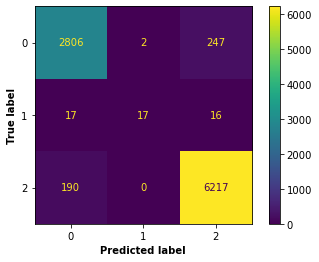

In [666]:
disp =plot_confusion_matrix(lm, X_test_scaled, Y_test)
print(disp)

In [667]:
print(classification_report(Y_test, lm.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.93      0.92      0.92      3055
           1       0.89      0.34      0.49        50
           2       0.96      0.97      0.96      6407

    accuracy                           0.95      9512
   macro avg       0.93      0.74      0.79      9512
weighted avg       0.95      0.95      0.95      9512



In [668]:
importance = lm.coef_[0]
Feat_num = []
Score = []
#for i,v in enumerate(importance):
    #print('Feature: %0d, Score: %.5f' % (i,v))
for i,v in enumerate(importance):
    Feat_num.append(i)
    Score.append(v)
feat_num = pd.DataFrame (Feat_num, columns = ['feature_number'])
score = pd.DataFrame (Score, columns = ['score'])


In [669]:
metrics_1 = names.merge(feat_num, left_index=True, right_index=True)
metrics = metrics_1.merge(score, left_index=True, right_index=True)
metrics['abs_score'] = metrics['score'].abs()
metrics.sort_values('abs_score', ascending=False).head(30)

,Contextual_features,feature_number,score,abs_score
36,lbpm_sc7_max,36,-3.1944413190,3.1944413190
110,hog_sc7_max,110,2.5177750919,2.5177750919
40,lbpm_sc5_mean,40,1.8025965115,1.8025965115
19,lbpm_sc7_mean,19,1.7733000263,1.7733000263
49,fourier_sc71_mean,49,-1.6395340964,1.6395340964
135,pantex_sc7_min,135,1.5463196615,1.5463196615
21,lbpm_sc3_kurtosis,21,-1.5319533665,1.5319533665
87,gabor_sc7_filter_13,87,1.5076162047,1.5076162047
34,lbpm_sc7_kurtosis,34,-1.4688778519,1.4688778519
39,lsr_sc71_line_length,39,1.3919298567,1.3919298567


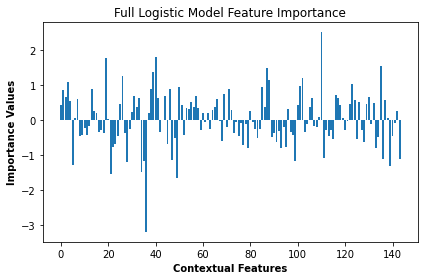

In [788]:
# plot feature importance
plt.figure()
plt.title('Full Logistic Model Feature Importance')
plt.bar([x for x in range(len(importance))], importance)
plt.xlabel('Contextual Features')
plt.ylabel('Importance Values')
plt.tight_layout()
plt.show()


# Over Sampled Logistic Model

# Gradient Boosting model

In [ ]:
gb_clf = GradientBoostingClassifier(n_estimators=100, learning_rate=0.05)
gb_clf.fit(X_train_scaled, Y_train)

# Gradient Boosting Predictions
gb_pred = gb_clf.predict(X_test_scaled)
gb_score = gb_clf.predict_proba(X_test_scaled)

In [675]:
# Gradient Boosting Results
print("\n")
print("Results Using Gradient Boosting & All Features: \n")
print("Classification Report: ")
print(classification_report(Y_test,gb_pred))



Results Using Gradient Boosting & All Features: 

Classification Report: 
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      3055
           1       0.75      0.30      0.43        50
           2       0.96      0.98      0.97      6407

    accuracy                           0.95      9512
   macro avg       0.89      0.73      0.78      9512
weighted avg       0.95      0.95      0.95      9512



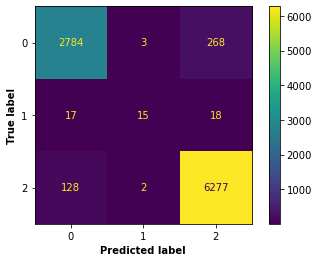

In [676]:
disp =plot_confusion_matrix(gb_clf, X_test_scaled, Y_test)
print(disp)

# Decision Tree

In [543]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(max_depth =4, random_state = 42)
clf.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

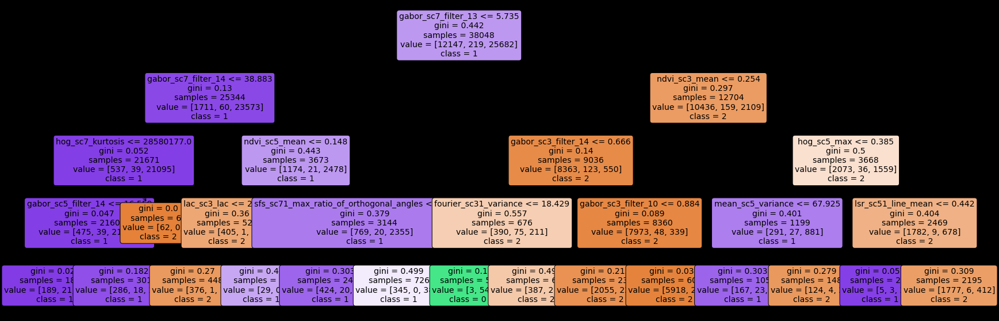

In [544]:
from sklearn import tree
feature_names=x_train.columns
#plt the figure, setting a black background
plt.figure(figsize=(30,10), facecolor ='k')
#create the tree plot
a = tree.plot_tree(clf,
                   #use the feature names stored
                   feature_names = feature_names,
                   #use the class names stored
                   class_names = labels,
                   rounded = True,
                   filled = True,
                   fontsize=14)
#show the plot
plt.show()

In [545]:
test_pred_decision_tree = clf.predict(x_test)

In [553]:
#get the confusion matrix
#confusion_matrix = metrics.confusion_matrix(y_train,  
#                                            test_pred_decision_tree)
plot_confusion_matrix(test_pred_decision_tree, x_test, y_test)  

ValueError: plot_confusion_matrix only supports classifiers

In [ ]:
#turn this into a dataframe
matrix_df = pd.DataFrame(confusion_matrix)
#plot the result
ax = plt.axes()
sns.set(font_scale=1.3)
plt.figure(figsize=(10,7))
sns.heatmap(matrix_df, annot=True, fmt="g", ax=ax, cmap="magma")
#set axis titles
ax.set_title('Confusion Matrix - Decision Tree')
ax.set_xlabel("Predicted label", fontsize =15)
ax.set_xticklabels(['']+labels)
ax.set_ylabel("True Label", fontsize=15)
ax.set_yticklabels(list(labels), rotation = 0)
plt.show()

In [ ]:
metrics.accuracy_score(y_test, test_pred_decision_tree)

# OverSampled Decision Tree

In [551]:
#SVC
from sklearn.svm import SVC
clf = SVC(random_state=0)
clf.fit(x_train, y_train)
SVC(random_state=0)
plot_confusion_matrix(clf, x_test, y_test)  
plt.show()

KeyboardInterrupt: 

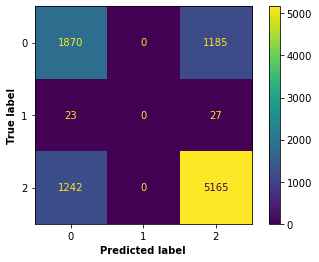

In [550]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clf, x_test, y_test)  
plt.figure()
plt.show()